# Loading Data

In [1]:
import pandas as pd
import re

In [2]:
shopee_train_df = pd.read_csv("./data/train.csv")
add_train_df = pd.read_csv("./data/shopee_reviews.csv")
test_df = pd.read_csv("./data/test.csv")

/home/aloysius/.miniconda/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3072: DtypeWarning: Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
add_train_df = add_train_df[add_train_df['label'] != 'label']
add_train_df = add_train_df.astype({"label": "int32"})
add_train_df = add_train_df.rename(columns = {"label": "rating", "text": "review"})
add_train_df

,rating,review
0,5,Looks ok. Not like so durable. Will hv to use ...
1,5,"Tried, the current can be very powerful depend..."
2,5,Item received after a week. Looks smaller than...
3,5,Thanks!!! Works as describe no complaints. Not...
4,5,Fast delivery considering it’s from overseas a...
...,...,...
1502570,5,Tried and it fit nicely will buy \nFast and go...
1502571,5,It's a fantastic product. Very reasonable pric...
1502572,5,Nice pair of shoes for a gd price. Note the cu...
1502573,1,Leather? Rubbish....moulded plastic. What a ...


In [4]:
train_df = pd.concat([shopee_train_df.drop('review_id', axis = 1), add_train_df])
train_df['rating'].value_counts()

5    1345447
4     143994
3      85024
1      43139
2      31781
Name: rating, dtype: int64

In [5]:
def process_text(text):
    text = ''.join(i for i in text if ord(i) < 128)       # remove non-ascii
    text = text.lower()                                   # lowercase
    text = text.strip()                                   # remove trailing whitespaces
    text = re.sub(r'\s+', ' ', text)                      # remove multiple whitespaces
    return text
train_df['review'] = train_df['review'].map(process_text)
train_df = train_df[train_df['review'] != '']
train_df['rating'].value_counts()

NameError: name 're' is not defined

In [ ]:
dedup = []
for review, group in merged_df.groupby('review'):
    dedup.append([review, round(float(group['rating'].mean()))])
train_df = pd.DataFrame(dedup, columns = ["review", "rating"])
train_df['rating'].value_counts()

In [ ]:
train_df_clean = pd.DataFrame(columns = train_df.columns.values)
for _, group in train_df.groupby("rating"):
    group = group.sample(n = 29830, random_state = 42)
    train_df_clean = pd.concat([train_df_clean, group])
train_df_clean

In [ ]:
test_df_clean = test_df.copy()
test_df_clean['review'] = test_df_clean['review'].map(process_text)
test_df_clean

# Prepare Training

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

In [2]:
# train_df_clean = pd.read_csv("./data/train_clean.csv")
# train_df_clean

,review,rating
0,aa aba,3
1,aa advertised functional value money great del...,4
2,aa advertised repeat order really super afford...,5
3,aa item receive described good condition,5
4,aaa battery power source k lap dc,2
...,...,...
226838,zipper spoil,3
226839,zipper work pure nonsense fall da trap like bu...,1
226840,zo garment hood milwaukee milwaukee star liver...,4
226841,zoo lion mitten booty set right size newborn h...,1


In [3]:
# test_df_clean = pd.read_csv("./data/test_clean.csv")
# test_df_clean

,review_id,review
0,1,great danger cool motif model delivery pack le...
1,2,one shade fit well
2,3,comfortable
3,4,fast delivery product expiry product wrap prop...
4,5,cute like play glitter well browsing phone ite...
...,...,...
60422,60423,product order ship quickly get good time use p...
60423,60424,opening time little scar fear destroyed eh not...
60424,60425,product quality excellent original product pro...
60425,60426,hold really well also


In [4]:
train, valid = train_test_split(train_df_clean, test_size = 0.2, random_state = 42)
print(train.shape)
print(valid.shape)

(181474, 2)
(45369, 2)


In [5]:
x_train, y_train = train["review"], train["rating"] - 1
x_valid, y_valid = valid["review"], valid["rating"] - 1
print(x_train.shape, y_train.shape)
print(y_train.value_counts())
print()
print(x_valid.shape, y_valid.shape)
print(y_valid.value_counts())

(181474,) (181474,)
4    44177
3    42191
2    40676
0    31363
1    23067
Name: rating, dtype: int64

(45369,) (45369,)
4    11005
3    10790
2    10125
0     7803
1     5646
Name: rating, dtype: int64


# Train Model

In [6]:
from transformers import TFDistilBertForSequenceClassification, DistilBertTokenizer, TFTrainer, TFTrainingArguments
import random
import string
from pathlib import Path

In [7]:
MODEL_DIR = Path("./model")
CHECKPOINT_DIR = Path("./checkpoint")

MODEL_DIR.mkdir(parents = True, exist_ok = True)
CHECKPOINT_DIR.mkdir(parents = True, exist_ok = True)

In [8]:
identifier = ''.join(random.choice(string.ascii_letters) for _ in range(8))
model_path = MODEL_DIR / identifier
checkpoint_path = CHECKPOINT_DIR / identifier
print("Model Path: {}".format(model_path))
print("Checkpoint Path: {}".format(checkpoint_path))

Model Path: model/WYnCjGgu
Checkpoint Path: checkpoint/WYnCjGgu


In [ ]:
model = TFDistilBertForSequenceClassification.from_pretrained("distilbert-base-uncased")

training_args = TFTrainingArguments(
    output_dir='./results',          # output directory
    num_train_epochs=3,              # total # of training epochs
    per_device_train_batch_size=16,  # batch size per device during training
    per_device_eval_batch_size=64,   # batch size for evaluation
    warmup_steps=500,                # number of warmup steps for learning rate scheduler
    weight_decay=0.01,               # strength of weight decay
    logging_dir='./logs',            # directory for storing logs
)

trainer = TFTrainer(
    model=model,                         # the instantiated 🤗 Transformers model to be trained
    args=training_args,                  # training arguments, defined above
    train_dataset=tfds_train_dataset,    # tensorflow_datasets training dataset
    eval_dataset=tfds_test_dataset       # tensorflow_datasets evaluation dataset
)

In [ ]:
learner.model.summary()

In [12]:
history = learner.fit_onecycle(0.00005, 4, checkpoint_folder = checkpoint_path)



begin training using onecycle policy with max lr of 8e-05...
Train for 5672 steps, validate for 1418 steps
Epoch 1/6
5672/5672 [==============================] - 3170s 559ms/step - loss: 1.1511 - accuracy: 0.5029 - val_loss: 1.0950 - val_accuracy: 0.5266
Epoch 2/6
5672/5672 [==============================] - 3122s 550ms/step - loss: 1.0666 - accuracy: 0.5429 - val_loss: 1.0842 - val_accuracy: 0.5379
Epoch 3/6
5672/5672 [==============================] - 3121s 550ms/step - loss: 1.0238 - accuracy: 0.5641 - val_loss: 1.0841 - val_accuracy: 0.5364
Epoch 4/6
5672/5672 [==============================] - 3124s 551ms/step - loss: 0.9563 - accuracy: 0.5940 - val_loss: 1.1126 - val_accuracy: 0.5351
Epoch 5/6
5672/5672 [==============================] - 3129s 552ms/step - loss: 0.8006 - accuracy: 0.6652 - val_loss: 1.1872 - val_accuracy: 0.5310
Epoch 6/6
5672/5672 [==============================] - 3131s 552ms/step - loss: 0.6030 - accuracy: 0.7557 - val_loss: 1.4367 - val_accuracy: 0.5190


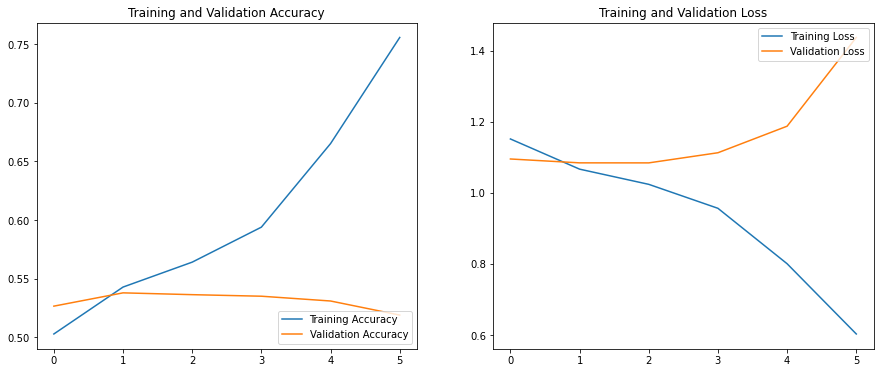

In [13]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(history.history["accuracy"]))

plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

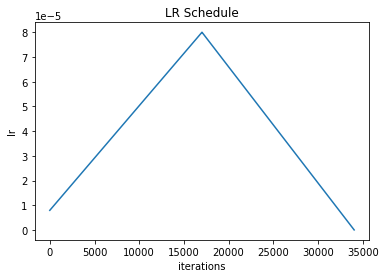

In [14]:
learner.plot('lr')

              precision    recall  f1-score   support

           1       0.64      0.59      0.61      7803
           2       0.31      0.30      0.30      5646
           3       0.42      0.44      0.43     10125
           4       0.46      0.47      0.46     10790
           5       0.71      0.70      0.71     11005

    accuracy                           0.52     45369
   macro avg       0.51      0.50      0.50     45369
weighted avg       0.52      0.52      0.52     45369



[]

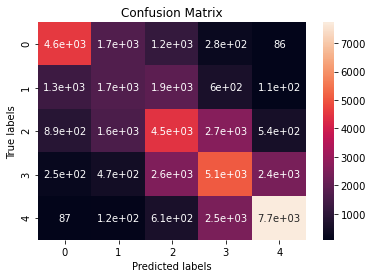

In [15]:
confusion_matrix = learner.validate(class_names = t.get_classes()) # class_names must be string values
ax = plt.subplot()
sns.heatmap(confusion_matrix, annot = True, ax = ax)

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.plot()

# Predicting

In [16]:
predictor = ktrain.get_predictor(learner.model, preproc=t)

In [17]:
predictor.save(model_path)

In [19]:
output_df = test_df_clean.copy()
output_df["rating"] = output_df["review"].map(lambda x: predictor.predict(str(x)))
output_df

,review_id,review,rating
0,1,great danger cool motif model delivery pack le...,3
1,2,one shade fit well,3
2,3,comfortable,5
3,4,fast delivery product expiry product wrap prop...,5
4,5,cute like play glitter well browsing phone ite...,5
...,...,...,...
60422,60423,product order ship quickly get good time use p...,3
60423,60424,opening time little scar fear destroyed eh not...,1
60424,60425,product quality excellent original product pro...,4
60425,60426,hold really well also,5


In [20]:
output_df.drop("review", axis = 1).to_csv(model_path / "prediction.csv", index = False)